<a href="https://colab.research.google.com/github/Gabriela-BF/Minimum-Viable-Product/blob/mvp-machine-learning/MVP_Gabriela_Ferreira.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MVP: Machine Learning & Analytics

Autor: Gabriela Bitencourt Ferreira

Data: 28/09/2025

Matrícula: 4052025001187

Dataset: Lipophilicity

---

## Motivação


A **lipofilicidade** de uma molécula, também conhecida como **hidrofobicidade**, é a sua afinidade por ambientes e substâncias não polares (apolares), como gorduras e óleos.  

Na área farmacêutica, conhecer essa propriedade é fundamental, pois ela influencia diretamente na absorção do medicamento, distribuição no organismo e excreção pelos sistemas de eliminação.  

Desenvolver um modelo de aprendizado de máquina de regressão para **prever a lipofilicidade** é extremamente útil, pois:

- Agiliza a descoberta de novos fármacos;  
- Economiza tempo e recursos;  
- Permite a seleção virtual dos candidatos mais promissores.  

---

## Conjunto de Dados

Neste projeto utilizaremos o dataset **Lipophilicity**, disponível no [Kaggle](https://www.kaggle.com/).  

O conjunto contém:  
- Identificadores das moléculas (SMILES);  
- Valores de **logD em pH 7.4**, obtidos experimentalmente.  

### O que é logD?  
O logD é o coeficiente de partição de uma molécula em um determinado pH, normalmente **7.4**, que corresponde ao pH do sangue humano e dos fluidos extracelulares.  

Representa a razão entre a concentração da substância em um solvente lipofílico e a concentração em água.  

Um valor elevado de logD indica que a molécula tende a ser mais **lipofílica** (afinidade maior por ambientes apolares).   

## 1. Dependências

### 1.1 Bibliotecas

In [ ]:
'''Instala a biblioteca RDKit, necessária para manipulação química,
extração de descritores moleculares e geração de fingerprints '''

!pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.1/36.1 MB 48.4 MB/s eta 0:00:00


In [ ]:
# Bibliotecas para download e manipulação de datasets do Kaggle
import kagglehub
from kagglehub import KaggleDatasetAdapter

# Bibliotecas para trabalhar com moléculas químicas
from rdkit import Chem
from rdkit.ML.Descriptors import MoleculeDescriptors
from rdkit.Chem import Descriptors, AllChem

# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

# Visualização de dados
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

# Acesso a pasta do drive
from google.colab import drive
drive.mount('/content/drive')

# Setup básico para projetos de aprendizado de máquina
from scipy.stats import skew, kurtosis, pearsonr,shapiro
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, cross_val_score, cross_val_predict, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor, ExtraTreesRegressor
import pandas as pd
import numpy as np
import os, random
import time
import joblib
import ast

# Reprodutibilidade
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### 1.2 Funções

In [ ]:
def evaluate_regression(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return {"MAE": mae, "RMSE": rmse, "R2": r2}

## 2. Conjunto de dados

### 2.1 Carga de dados

In [ ]:
# Download conjunto de dados
dataset_dir = kagglehub.dataset_download("markinsuff/lipophilicity")

# Caminho para o conjunto de dados dentro do banco de dados
file_path = "Lipophilicity.csv"

# Carregar o conjunto de dados na variável df
df = kagglehub.dataset_load(KaggleDatasetAdapter.PANDAS, "markinsuff/lipophilicity", file_path)

# Imprimir o conjunto para checar
print(df.head())

100%|██████████| 130k/130k [00:00<00:00, 25.5MB/s]

Extracting files...


Using Colab cache for faster access to the 'lipophilicity' dataset.
   CMPD_CHEMBLID   exp                                             smiles  \
0   CHEMBL596271  3.54            Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14   
1  CHEMBL1951080 -1.18  COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...   
2     CHEMBL1771  3.69             COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl   
3   CHEMBL234951  3.37  OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...   
4   CHEMBL565079  3.10  Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...   

                                        RDKIT_SMILES  
0            Cn1c(CN2CCN(c3ccc(Cl)cc3)CC2)nc2ccccc21  
1  COc1cc(OC)c(S(=O)(=O)N2c3ccccc3CCC2C)cc1NC(=O)...  
2              COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1  
3  O=C(NC1Cc2ccccc2N(C[C@@H](O)CO)C1=O)c1cc2cc(Cl...  
4  Cc1cccc(C[C@H](NC(=O)c2cc(C(C)(C)C)nn2C)C(=O)N...  


### 2.2 Descritores moleculares e fingerprints

As colunas SMILES do conjunto de dados representam a estrutura da molécula por meio de uma string que descreve seus átomos, ligações e aromaticidade.
No entanto, para um algoritmo de aprendizado de máquina, essa informação é apenas uma sequência de caracteres, sem significado químico direto.
Assim, não é possível extrair padrões úteis para relacionar com a lipofilicidade a partir do SMILES cru.

Por esse motivo, irei converter os SMILES em descritores moleculares: valores numéricos que quantificam propriedades físico-químicas ou estruturais das moléculas, como peso molecular, área superficial polar, número de doadores e aceptores de hidrogênio, entre outros.

Além disso, irei utilizar também os fingerprints moleculares, que são vetores binários (0/1) indicando a presença ou ausência de subestruturas químicas específicas, como anéis aromáticos, grupos hidroxila ou fragmentos fenila.

Tanto os descritores quanto os fingerprints podem ser extraídos diretamente a partir do SMILES usando a biblioteca RDKit, amplamente utilizada em pesquisa e desenvolvimento em química, farmácia e biologia.



- Essa célula pode levar em torno de 2 minuto para ser concluída

In [ ]:
# Descritores Moleculares (+- 2 min)

# Cria coluna com objeto mol
df["mol"] = df["RDKIT_SMILES"].apply(lambda x: Chem.MolFromSmiles(x))

# Lista de descritores disponíveis
descriptor_names = [desc[0] for desc in Descriptors._descList]

# Criar calculadora
calc = MoleculeDescriptors.MolecularDescriptorCalculator(descriptor_names)

# Extrair descritores diretamente com lambda
desc_values = df["mol"].apply(lambda mol: calc.CalcDescriptors(mol) if mol is not None else [np.nan]*len(descriptor_names))

# Converter para DataFrame
desc_df = pd.DataFrame(desc_values.tolist(), columns=descriptor_names)

# Juntar com o dataset original
df_desc = pd.concat([df, desc_df], axis=1)


In [ ]:
df_desc

,CMPD_CHEMBLID,exp,smiles,RDKIT_SMILES,mol,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,CHEMBL596271,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,Cn1c(CN2CCN(c3ccc(Cl)cc3)CC2)nc2ccccc21,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d07760>,5.976320,5.976320,0.790958,0.790958,0.728444,...,0,0,0,0,0,0,0,0,0,0
1,CHEMBL1951080,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,COc1cc(OC)c(S(=O)(=O)N2c3ccccc3CCC2C)cc1NC(=O)...,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d077d0>,13.847757,13.847757,0.083663,-4.060285,0.545587,...,1,1,0,0,0,0,0,0,0,0
2,CHEMBL1771,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d07840>,12.294248,12.294248,0.262241,-0.447454,0.807761,...,0,0,0,0,0,0,0,1,0,0
3,CHEMBL234951,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,O=C(NC1Cc2ccccc2N(C[C@@H](O)CO)C1=O)c1cc2cc(Cl...,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d07a00>,12.966133,12.966133,0.046181,-1.063518,0.506650,...,0,0,0,0,0,0,0,1,0,0
4,CHEMBL565079,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,Cc1cccc(C[C@H](NC(=O)c2cc(C(C)(C)C)nn2C)C(=O)N...,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d07a70>,12.834652,12.834652,0.112199,-0.795707,0.747686,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,CHEMBL496929,3.85,OCCc1ccc(NC(=O)c2cc3cc(Cl)ccc3[nH]2)cc1,O=C(Nc1ccc(CCO)cc1)c1cc2cc(Cl)ccc2[nH]1,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d9b450>,12.263937,12.263937,0.114415,-0.206268,0.688505,...,0,0,0,0,0,0,0,0,0,0
4196,CHEMBL199147,3.21,CCN(C1CCN(CCC(c2ccc(F)cc2)c3ccc(F)cc3)CC1)C(=O...,CCN(C(=O)Cc1ccc(S(C)(=O)=O)cc1)C1CCN(CCC(c2ccc...,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d9b4c0>,13.543113,13.543113,0.034005,-3.267070,0.334738,...,0,0,1,0,0,0,0,0,0,0
4197,CHEMBL15932,2.10,COc1cccc2[nH]ncc12,COc1cccc2[nH]ncc12,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d9b530>,5.125787,5.125787,0.857639,0.857639,0.666148,...,0,0,0,0,0,0,0,0,0,0
4198,CHEMBL558748,2.65,Clc1ccc2ncccc2c1C(=O)NCC3CCCCC3,O=C(NCC1CCCCC1)c1c(Cl)ccc2ncccc12,<rdkit.Chem.rdchem.Mol object at 0x7d33e4d9b5a0>,12.498811,12.498811,0.093358,-0.093358,0.923057,...,0,0,0,0,0,0,0,0,0,0


### 2.3 Divisão dos dados

In [ ]:
# Seleciona apenas colunas numéricas
df_numeric = df_desc.select_dtypes(include=['int64', 'float64'])

# Divide os dados em target e variáveis
target = "exp"
features = [c for c in df_numeric.columns if c not in [target]]

x = df_numeric[features].copy()
y = df_numeric[target].copy()

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(
    x,
    y,
    test_size=0.2,
    random_state=SEED,
    stratify=None  # Must be None for regression
)

print("Treino:", x_train.shape, "| Teste:", x_test.shape)

# Craindo folds para validacao cruzada
num_particoes = 10
kfold = KFold(n_splits=num_particoes, shuffle=True, random_state=7)

Treino: (3360, 217) | Teste: (840, 217)


### 2.5 Análise exploratória

- **Distribuicao**

O grafico mostra que a maioria da minhas amostras possuem valores de logD entre 2 e 3. Isso reflete a realidade dos compostos bioativos no mundo, como os que são usados no desenvolvimento de fármacos.

A regra mais famosa em química medicinal é a Regra dos Cinco de Lipinski, que prevê a biodisponibilidade oral de um composto. Uma das regras é que o logP (ou logD em pH neutro) deve ser menor que 5. Compostos com logD muito alto tendem a ser muito insolúveis e difíceis de serem absorvidos pelo corpo.

Na prática, a maioria dos fármacos aprovados e compostos candidatos a fármacos têm um logD dentro de uma faixa ideal para equilibrar a solubilidade em água e a capacidade de atravessar membranas lipídicas (como as paredes celulares). Essa faixa ideal frequentemente se situa entre 1 e 3.

- **Normalidade**



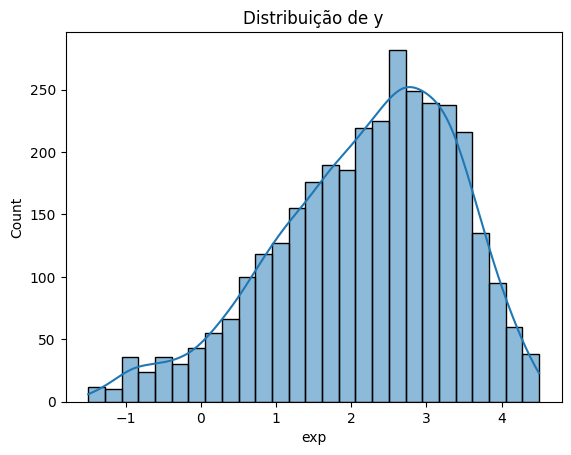

Shapiro-Wilk Test: stat=0.971, p=3.4982909938696577e-28


In [ ]:
df_temp = x_train.copy()
df_temp['exp'] = y

sns.histplot(df_temp['exp'], kde=True)
plt.title("Distribuição de y")
plt.show()

stat, p = shapiro(y)
print(f"Shapiro-Wilk Test: stat={stat:.3}, p={p}")

No boxplot da variavel alvo (logD) podemos ver claramente alguns pontos à esquerda do box plot, mais especificamente a partir dos valores menores que -1, que representam os outliers.

Porém eu fiz a escolha de nao eliminar esses dados, pois representam a realidade. valores negativos não são erros de medição;  eles existem na natureza. Por exemplo, moléculas hidrofílicas como aminoácidos ou certos fármacos possuem logD negativo. Se você remove esses dados, o modelo aqui desenvolvido nunca aprenderá a prever o comportamento de moléculas com essa característica



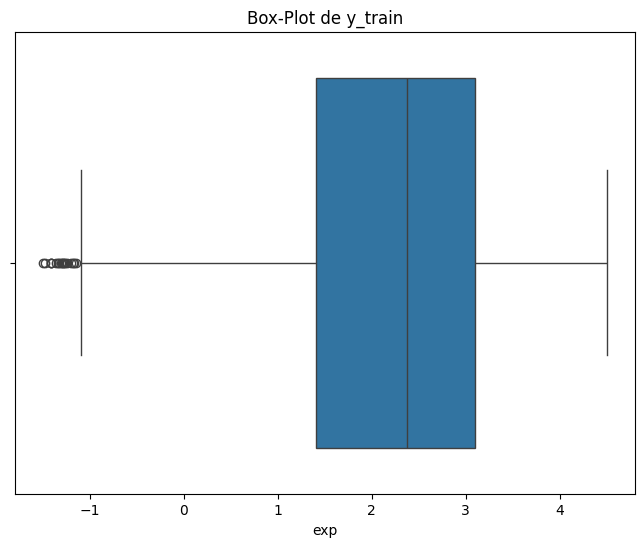

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=y_train)
plt.title('Box-Plot de y_train')
plt.show()

Top 5 features mais correlacionadas com exp:
Index(['MolLogP', 'fr_COO2', 'fr_COO', 'NumAromaticRings', 'RingCount'], dtype='object')


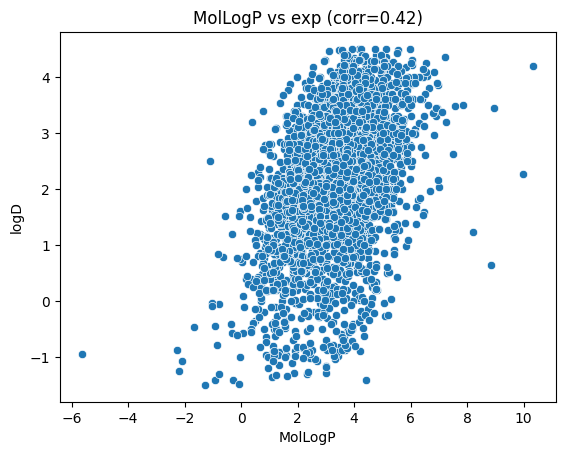

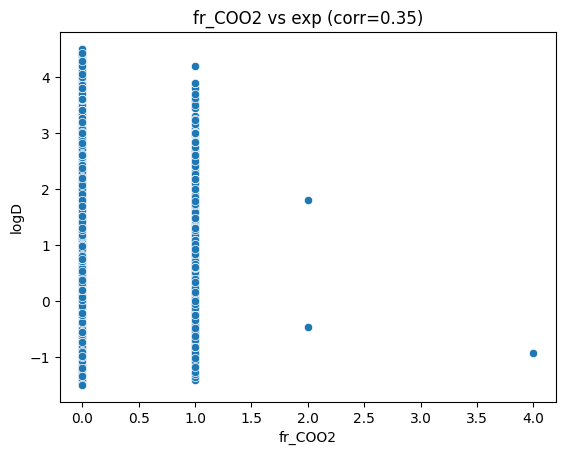

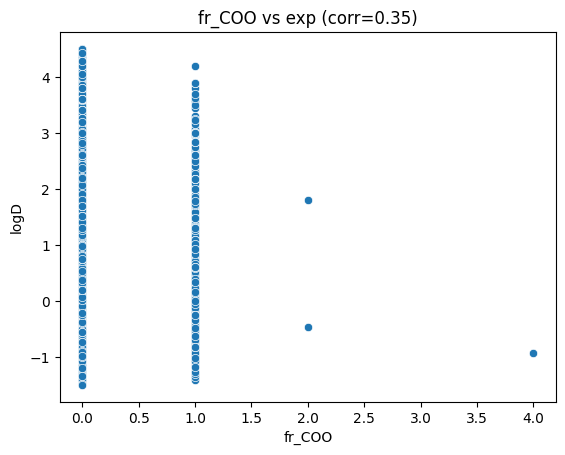

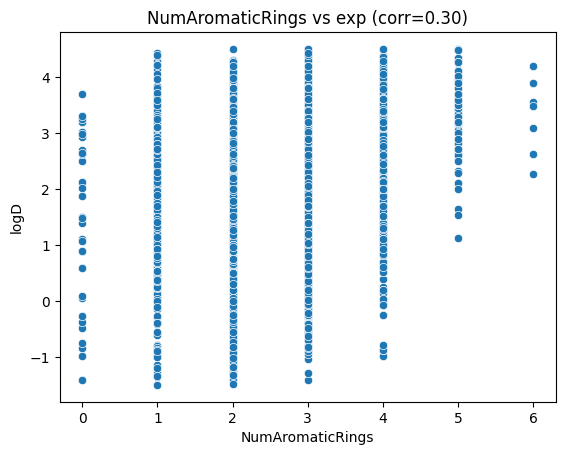

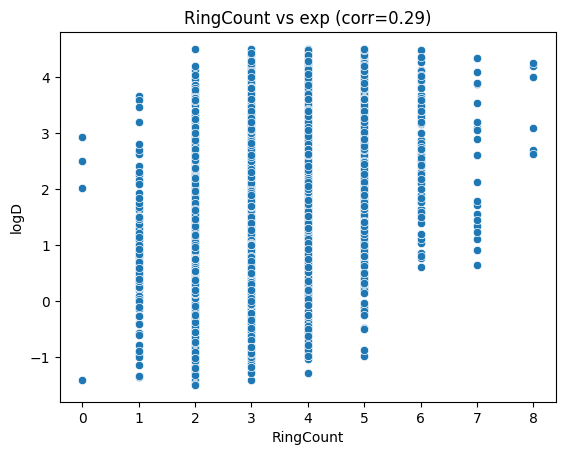

In [ ]:
# Combine x_final and y temporarily to compute correlations
df_temp = x_train.copy()
df_temp['exp'] = y

# Calculate correlation of each feature with the target
correlations = df_temp.corr()['exp'].abs().sort_values(ascending=False)

# Select the top 5 features most correlated with the target (excluding 'exp' itself)
top5_features = correlations.drop('exp').head(5).index

print("Top 5 features mais correlacionadas com exp:")
print(top5_features)

# Plot scatterplots for these top features
for col in top5_features:
    corr_value = correlations[col]
    sns.scatterplot(x=df_temp[col], y=df_temp['exp'])
    plt.title(f'{col} vs exp (corr={corr_value:.2f})')
    plt.xlabel(col)
    plt.ylabel('logD')
    plt.show()

## 3. Modelagem

### 3.1 Baseline e modelos candidatos
Essa célula leva em torno de 24 minutos para finalizar

In [ ]:
# Configurações iniciais para o modelo
kfold = KFold(n_splits=5, shuffle=True, random_state=7)
scoring = 'neg_mean_squared_error'

# Criacao da pasta para salvar os modelos
model_dir = "/content/drive/MyDrive/models"

# Criar somente se a pasta nao existe
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
    print(f"Created folder: {model_dir}")

# Criacao de listas
results = []
names_models = []
summary_results = []
cleaned_models = {}
models = []

# Teste de pré-processamento com a padronizacao, normalizacao e mantendo o dado original
numeric_pipe_standard = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

numeric_pipe_minmax = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", MinMaxScaler())
])

numeric_pipe_none = Pipeline([
    ("imputer", SimpleImputer(strategy="median"))
])

# Hiperparâmetros padrão para ensembles
num_trees = 100
max_features = 3

# Lista de algoritmos a serem avaliados
base_models = [
    ('Dummy', DummyRegressor(strategy="median")),
    ('LR', LinearRegression()),
    ('Ridge', Ridge()),
    ('Lasso', Lasso()),
    ('KNN', KNeighborsRegressor()),
    ('CART', DecisionTreeRegressor()),
    ('SVM', SVR()),

#Ensembles com os padrões definidos
    ('RF', RandomForestRegressor(
        n_estimators=num_trees, max_features=max_features, random_state=7)),

    ('ExtraTrees', ExtraTreesRegressor(
        n_estimators=num_trees, max_features=max_features, random_state=7)),

    ('Bagging', BaggingRegressor(
        n_estimators=num_trees, random_state=7)),

    ('AdaBoost', AdaBoostRegressor(
        n_estimators=num_trees, random_state=7)),

#    ('GB', GradientBoostingRegressor(
#        n_estimators=num_trees, max_features=max_features, random_state=7))
]

# Criando pipelines para cada visão do dataset
for name, model in base_models:
    models.append((f"{name}-orig", Pipeline([("pre", numeric_pipe_none), ("model", model)])))
    models.append((f"{name}-std", Pipeline([("pre", numeric_pipe_standard), ("model", model)])))
    models.append((f"{name}-norm", Pipeline([("pre", numeric_pipe_minmax), ("model", model)])))


In [ ]:
# Avaliando cada modelo
for name, model in models:
    model_path = f"{model_dir}/{name}.pkl"

    if os.path.exists(model_path):
        # Load the model if already trained
        print(f"Loading cached model: {name}")
        model = joblib.load(model_path)
        cleaned_models[name] = model
        continue  # Skip training and evaluation

    # If model not found, train it
    print(f"Training model: {name}")
    start_time = time.time()

    # Treinamento do modelo com cross-validation
    y_pred = cross_val_predict(model, x_train, y_train, cv=kfold)
    cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring='neg_mean_squared_error')

    # Calcula o tempo que demorou para treinar o modelo
    elapsed_time = time.time() - start_time

    # Salvar resultados e nome do modelo sendo treinado
    results.append(-cv_results)
    names_models.append(name)
    cv_mse_folds = (-cv_results).tolist()

    # Métricas para avaliacao
    metrics = evaluate_regression(y_train, y_pred)
    corr, _ = pearsonr(y_train, y_pred)

    summary_results.append({
        "Modelo": name,
        "MAE": metrics["MAE"],
        "RMSE": metrics["RMSE"],
        "R2": metrics["R2"],
        "Correlação": corr,
        "Tempo(s)": elapsed_time,
        "CV_MSE": cv_mse_folds,     # Lista de MSEs por fold
        "y_train": y_train.tolist(),
        "y_pred": y_pred.tolist()
    })

    print(f'{name}: MAE {metrics["MAE"]:.3f} - RMSE {metrics["RMSE"]:.3f} - R2 {metrics["R2"]:.3f} - Corr {corr:.3f}')

    # Fit final do modelo
    model.fit(x_train, y_train)
    cleaned_models[name] = model

    # Save the trained model
    joblib.dump(model, model_path)
    print(f"Modelo salvo em: {model_path}")


Loading cached model: Dummy-orig
Loading cached model: Dummy-std
Loading cached model: Dummy-norm
Loading cached model: LR-orig
Loading cached model: LR-std
Loading cached model: LR-norm
Loading cached model: Ridge-orig
Loading cached model: Ridge-std
Loading cached model: Ridge-norm
Loading cached model: Lasso-orig
Loading cached model: Lasso-std
Loading cached model: Lasso-norm
Loading cached model: KNN-orig
Loading cached model: KNN-std
Loading cached model: KNN-norm
Loading cached model: CART-orig
Loading cached model: CART-std
Loading cached model: CART-norm
Loading cached model: SVM-orig
Loading cached model: SVM-std
Loading cached model: SVM-norm
Loading cached model: RF-orig
Loading cached model: RF-std
Loading cached model: RF-norm
Loading cached model: ExtraTrees-orig
Loading cached model: ExtraTrees-std
Loading cached model: ExtraTrees-norm
Loading cached model: Bagging-orig
Loading cached model: Bagging-std
Loading cached model: Bagging-norm
Loading cached model: AdaBoost-o

In [ ]:
file_results_all = os.path.join(model_dir, "results_all.csv")

# Convertendo summary_results para DataFrame
df_summary = pd.DataFrame(summary_results)

# Função para decidir df_results final
if os.path.exists(file_results_all):
    df_results_all = pd.read_csv(file_results_all)

    if df_summary.empty:
        # Caso summary_results esteja vazio, usar results_all
        df_results = df_results_all
    else:
        # Caso haja conteúdo em ambos, fazer merge
        df_results = pd.concat([df_summary, df_results_all], ignore_index=True)
else:
    # Caso não exista results_all, usar summary_results
    df_results = df_summary

# Remover duplicatas considerando apenas o nome do modelo
df_results = df_results.drop_duplicates(subset='Modelo', keep='first')

# Ordenando pelo RMSE e arredondando
df_results = df_results.sort_values(by='RMSE').round(3)

# Salvando o DataFrame consolidado
df_results.to_csv(file_results_all, index=False)

df_results

,Modelo,MAE,RMSE,R2,Correlação,Tempo(s),CV_MSE,y_train,y_pred
0,SVM-std,5.110000e-01,6.870000e-01,6.720000e-01,0.822,20.602,"[0.4879851294976194, 0.45218570791020984, 0.47...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.0499013765530787, 1.5997206632515129, 3.188..."
1,Bagging-std,5.400000e-01,7.130000e-01,6.470000e-01,0.806,452.835,"[0.552248141182765, 0.508917393982785, 0.52834...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.963133333333334, 1.6026999999999996, 2.9627..."
2,Bagging-norm,5.420000e-01,7.140000e-01,6.450000e-01,0.806,466.531,"[0.5511516686603616, 0.5111553338951739, 0.529...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.9813333333333354, 1.5674, 2.979416666666667..."
3,Bagging-orig,5.410000e-01,7.140000e-01,6.450000e-01,0.805,457.607,"[0.5511273706875167, 0.5091103167524553, 0.533...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.998400000000001, 1.5546, 2.963183333333335,..."
4,SVM-norm,5.710000e-01,7.430000e-01,6.160000e-01,0.791,19.077,"[0.5982099841058519, 0.5579961644162222, 0.540...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.170181796617884, 1.6751418509982599, 2.8102..."
5,ExtraTrees-std,5.950000e-01,7.870000e-01,5.690000e-01,0.777,10.312,"[0.661941092626488, 0.6070423986755953, 0.6262...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.2135000000000016, 1.6999999999999986, 2.987..."
6,ExtraTrees-norm,5.990000e-01,7.890000e-01,5.670000e-01,0.776,8.665,"[0.660073786376488, 0.6201560187872024, 0.6316...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.028500000000001, 1.6999999999999986, 3.0263..."
7,ExtraTrees-orig,5.990000e-01,7.900000e-01,5.660000e-01,0.775,10.001,"[0.6730892876190476, 0.6172112039434525, 0.626...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[1.9708000000000008, 1.6999999999999986, 3.072..."
8,RF-std,6.190000e-01,8.010000e-01,5.540000e-01,0.777,12.982,"[0.6875129536715257, 0.6466534759696774, 0.624...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.0568999999999993, 1.7861000000000002, 2.980..."
9,RF-norm,6.200000e-01,8.040000e-01,5.510000e-01,0.775,13.040,"[0.6809078042295154, 0.6462689540448792, 0.643...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[1.9279000000000004, 1.7834, 2.982630952380953..."


In [ ]:
results

[]

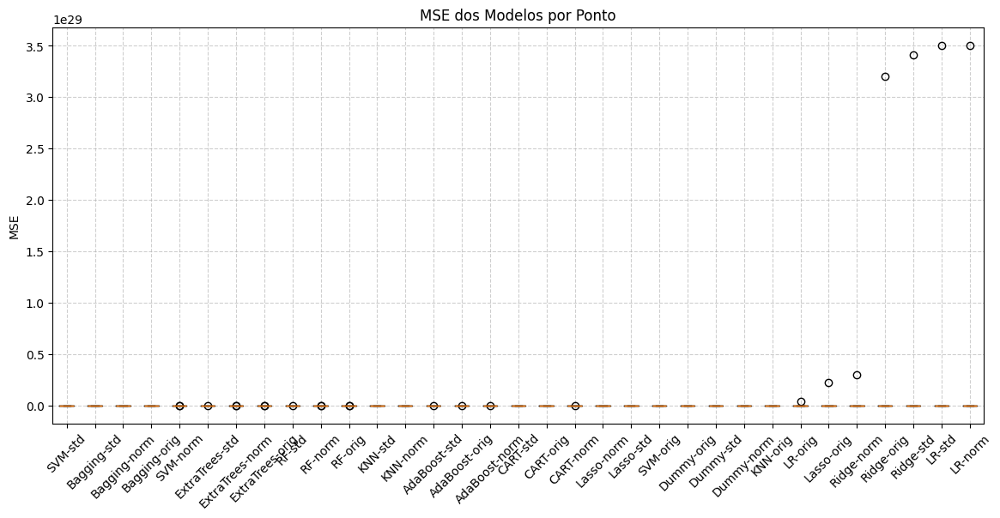

In [ ]:
# Boxplot dos resultados
results = [ast.literal_eval(r) for r in df_results['CV_MSE']]
names_models = df_results['Modelo'].tolist()

# Boxplot
plt.figure(figsize=(14, 6))
plt.boxplot(results)
plt.xticks(range(1, len(names_models)+1), names_models, rotation=45)
plt.title('MSE dos Modelos por Ponto')
plt.ylabel('MSE')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

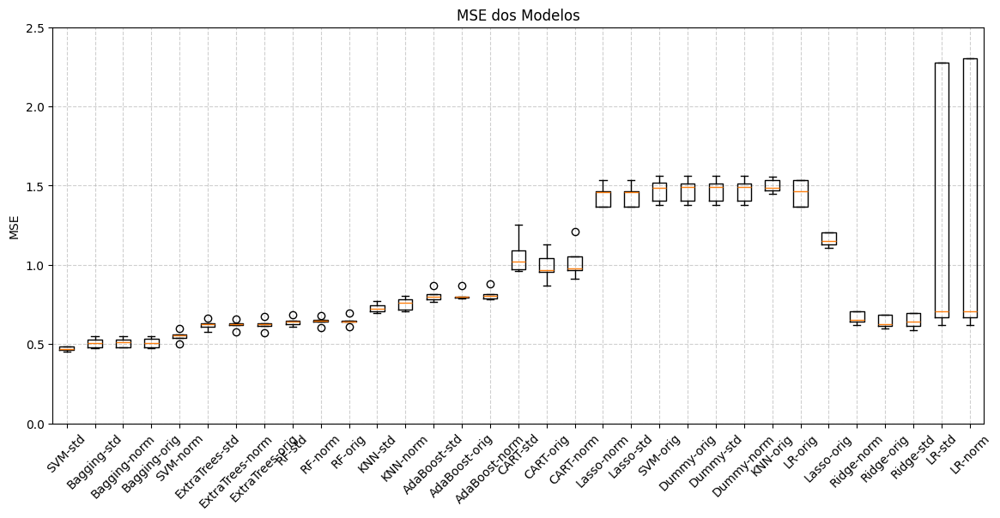

In [ ]:
# Boxplot com limite no eixo y
plt.figure(figsize=(14, 6))
plt.boxplot(results)
plt.xticks(range(1, len(names_models)+1), names_models, rotation=45)
plt.title('MSE dos Modelos')
plt.ylabel('MSE')
plt.ylim(0, 2.5)  # Limite do eixo y
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

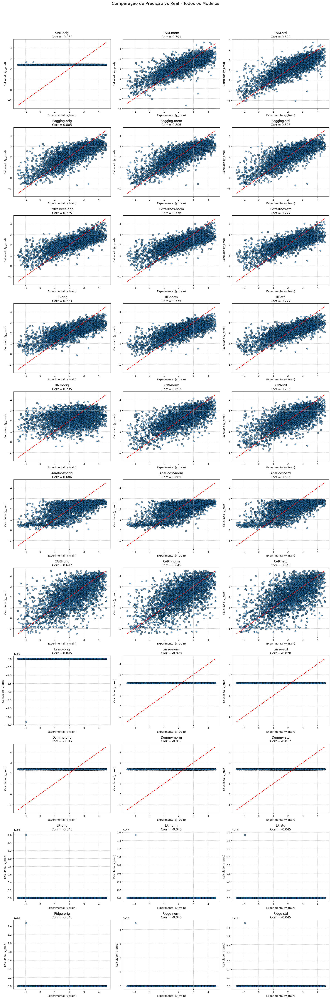

In [ ]:
# Preparações
preparacoes = ["orig", "norm", "std"]

# Modelos base (removendo sufixos -orig/-norm/-std)
model_bases = df_results['Modelo'].apply(lambda x: x.split('-')[0]).unique()

# Número de linhas = número de modelos
n_models = len(model_bases)
plt.figure(figsize=(18, 5 * n_models))

for row_idx, model_base in enumerate(model_bases):
    for col_idx, prep in enumerate(preparacoes):
        model_name = f"{model_base}-{prep}"
        df_model = df_results[df_results['Modelo'] == model_name]

        plt_idx = row_idx * 3 + col_idx + 1
        plt.subplot(n_models, 3, plt_idx)

        if not df_model.empty:
            y_train = np.array(ast.literal_eval(df_model.iloc[0]['y_train']))
            y_pred = np.array(ast.literal_eval(df_model.iloc[0]['y_pred']))
            corr = df_model.iloc[0]['Correlação']

            plt.scatter(y_train, y_pred, alpha=0.6, edgecolor='k')
            plt.plot([y_train.min(), y_train.max()],
                     [y_train.min(), y_train.max()], 'r--', lw=2)

            plt.xlabel('Experimental (y_train)')
            plt.ylabel('Calculado (y_pred)')
            plt.title(f'{model_name}\nCorr = {corr:.3f}')
            plt.grid(True, linestyle='--', alpha=0.6)

plt.suptitle("Comparação de Predição vs Real - Todos os Modelos", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 3.2 Hiperparametrização
A hiperparametrizacao foi feita nos melhores modelos criados no passo anterior. Nesse MVP foi retirado a hiperparametrizacao do SVM mesmo sendo o melhor modelo por conta do tempo de execucao. Mesmo reduzindo os parametros a serem avaliados, a execucao demorou mais de 30 minutos

- Foi feita uma hiperparametrizacao inicial no KNN com os valores 'model__n_neighbors': [3, 5, 7, 9, 11] - Isso gerou um overfitting no modelo, com valor de 1 no R2 no conjunto treino e 0,7 no conjunto teste.

In [ ]:
# Resultados obtidos em runs anteriores

best_params_dict = {
    'KNN-std': {'n_neighbors': 5, 'p': 1, 'weights': 'distance'},
    'CART-std': {'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 1},
    'RF-std': {'n_estimators': 200, 'max_features': 5, 'max_depth': None,'min_samples_split': 2, 'min_samples_leaf': 1},
    'ExtraTrees-std': {'n_estimators': 200, 'max_features': 5, 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1},
    'SVM-std': {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}
}



In [ ]:
# Definição dos hiperparâmetros
param_grids = {
    'KNN-std': {
        'model__n_neighbors': [5, 9, 15, 21, 31, 51],
        'model__weights': ['uniform', 'distance'],
        'model__p': [1, 2]
    },
    'CART-std': {
        'model__max_depth': [None, 5, 10, 20],
        'model__min_samples_split': [2, 5, 10],
        'model__min_samples_leaf': [1, 2, 4]
    },
    'RF-std': {
        'model__n_estimators': [50, 100, 200],
        'model__max_features': [2, 3, 5],
        'model__max_depth': [None, 5, 10, 20],
        'model__min_samples_split': [2, 5, 10],
        'model__min_samples_leaf': [1, 2, 4]
    },
    'ExtraTrees-std': {
        'model__n_estimators': [50, 100, 200],
        'model__max_features': [2, 3, 5],
        'model__max_depth': [None, 5, 10, 20],
        'model__min_samples_split': [2, 5, 10],
        'model__min_samples_leaf': [1, 2, 4]
    },
    'SVM-std': {
        'model__kernel': ['linear', 'rbf'],
        'model__C': [0.1, 1, 10],
        'model__gamma': ['scale'],
        'model__degree': [2, 3]
    }
}

# Loop de GridSearchCV com verificação do dicionário
best_models = {}

for name in ['KNN-std', 'CART-std', 'RF-std', 'ExtraTrees-std', 'SVM-std']:
    if name in best_params_dict:
        print(f"{name} já possui parâmetros conhecidos. Pulando GridSearch.")

        if name == 'KNN-std':
            model = KNeighborsRegressor(**best_params_dict[name])
        elif name == 'CART-std':
            model = DecisionTreeRegressor(**best_params_dict[name])
        elif name == 'RF-std':
            model = RandomForestRegressor(**best_params_dict[name])
        elif name == 'ExtraTrees-std':
            model = ExtraTreesRegressor(**best_params_dict[name])
        elif name == 'SVM-std':
            model = SVR(**best_params_dict[name])
        else:
            continue

        # Final pipeline: preprocessing + model
        best_models[name] = Pipeline([
            ("pre", numeric_pipe_standard),
            ("model", model)
        ])

        continue

    # Rodar GridSearchCV apenas se o modelo não estiver no dicionário
    print(f"\nHiperparametrizando: {name}")
    model_pipeline = next(model for n, model in models if n == name)
    param_grid = param_grids[name]

    grid_search = GridSearchCV(model_pipeline, param_grid, cv=kfold,
                               scoring='neg_mean_squared_error', n_jobs=-1)
    grid_search.fit(x_train, y_train)

    best_models[name] = grid_search.best_estimator_

    # Atualiza o dicionário com os melhores parâmetros encontrados
    best_params_dict[name] = {k.replace('model__', ''): v for k, v in grid_search.best_params_.items()}

    print(f"Melhores parâmetros para {name}: {best_params_dict[name]}")
    print(f"MSE CV: {-grid_search.best_score_:.3f}")


KNN-std já possui parâmetros conhecidos. Pulando GridSearch.
CART-std já possui parâmetros conhecidos. Pulando GridSearch.
RF-std já possui parâmetros conhecidos. Pulando GridSearch.
ExtraTrees-std já possui parâmetros conhecidos. Pulando GridSearch.

Hiperparametrizando: SVM-std
Melhores parâmetros para SVM-std: {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}
MSE CV: 0.430


In [ ]:
summary_results = []

for name, pipeline in best_models.items():
    # Marca o momento que o treinamento começou
    start_time = time.time()

    # Cross-validation predictions com o pipeline completo
    y_pred = cross_val_predict(pipeline, x_train, y_train, cv=kfold)

    # Calcula o tempo que demorou para treinar o modelo
    elapsed_time = time.time() - start_time

    # Avaliação
    metrics = evaluate_regression(y_train, y_pred)
    corr, _ = pearsonr(y_train, y_pred)

    summary_results.append({
        "Modelo": f"{name}_hiper",
        "MAE": metrics["MAE"],
        "RMSE": metrics["RMSE"],
        "R2": metrics["R2"],
        "Correlação": corr,
        "Tempo(s)": elapsed_time
    })

# Cria DataFrame com os resultados
df_results = pd.DataFrame(summary_results)
df_results = df_results.sort_values(by="RMSE").round(3)
df_results

,Modelo,MAE,RMSE,R2,Correlação,Tempo(s)
4,SVM-std_hiper,0.473,0.656,0.701,0.838,5.246
3,ExtraTrees-std_hiper,0.576,0.764,0.594,0.789,6.267
2,RF-std_hiper,0.605,0.786,0.571,0.783,9.528
0,KNN-std_hiper,0.589,0.798,0.557,0.748,2.040
1,CART-std_hiper,0.704,0.888,0.452,0.674,0.880


KNN-std otimizado: MSE 0.637 - RMSE 0.798 - Corr 0.748


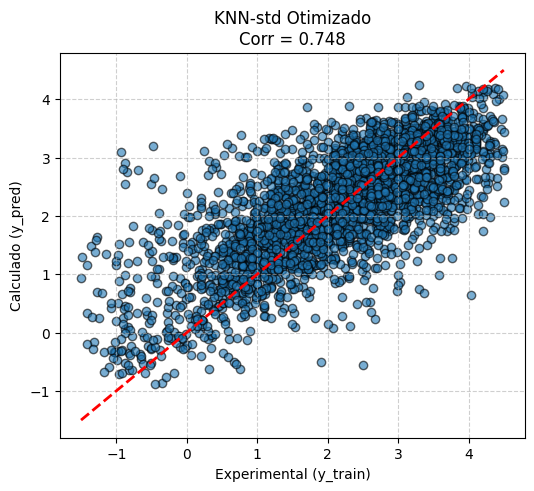

CART-std otimizado: MSE 0.803 - RMSE 0.896 - Corr 0.672


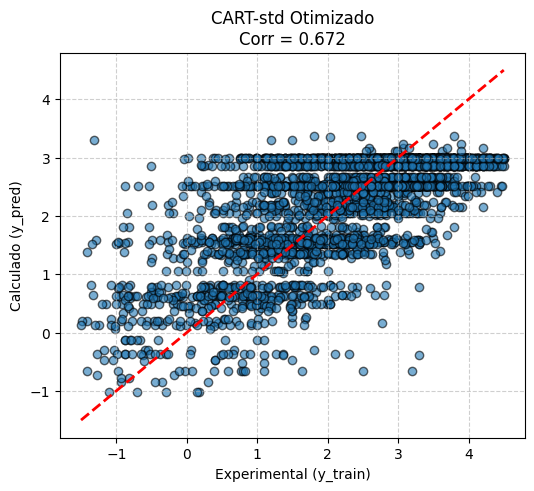

RF-std otimizado: MSE 0.614 - RMSE 0.784 - Corr 0.789


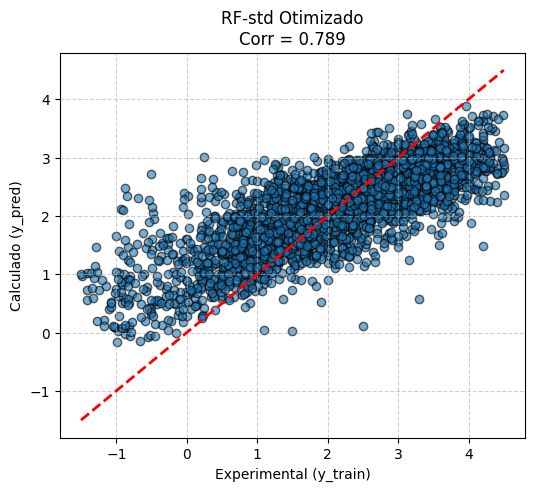

ExtraTrees-std otimizado: MSE 0.582 - RMSE 0.763 - Corr 0.787


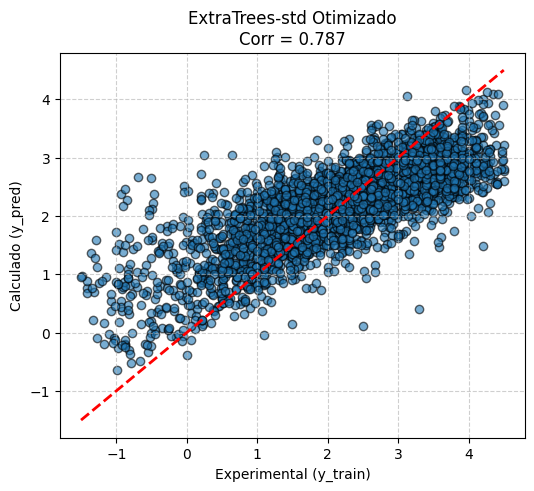

SVM-std otimizado: MSE 0.430 - RMSE 0.656 - Corr 0.838


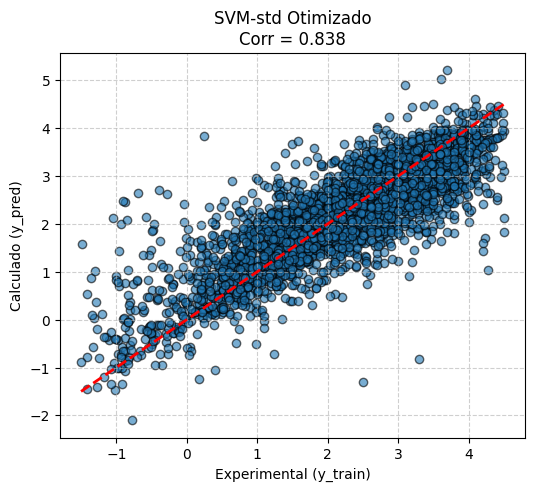

In [ ]:
for name, pipeline in best_models.items():
    # Predições em cross-validation
    y_pred = cross_val_predict(pipeline, x_train, y_train, cv=kfold)

    # Correlação
    corr, _ = pearsonr(y_train, y_pred)

    # MSE e RMSE via cross_val_score
    cv_results = cross_val_score(pipeline, x_train, y_train, cv=kfold, scoring='neg_mean_squared_error')
    mse = -cv_results.mean()
    rmse = np.sqrt(mse)

    print(f'{name} otimizado: MSE {mse:.3f} - RMSE {rmse:.3f} - Corr {corr:.3f}')

    # Gráfico de predição vs real
    plt.figure(figsize=(6, 5))
    plt.scatter(y_train, y_pred, alpha=0.6, edgecolor='k')
    plt.plot([y_train.min(), y_train.max()],
             [y_train.min(), y_train.max()], 'r--', lw=2)
    plt.xlabel('Experimental (y_train)')
    plt.ylabel('Calculado (y_pred)')
    plt.title(f'{name} Otimizado\nCorr = {corr:.3f}')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

### 3.2 Validação


Treinando e avaliando: Dummy-orig
Treino: MAE 0.964 | RMSE 1.212 | R2 -0.021 | Corr nan
Teste: MAE 0.971 | RMSE 1.236 | R2 -0.035 | Corr nan


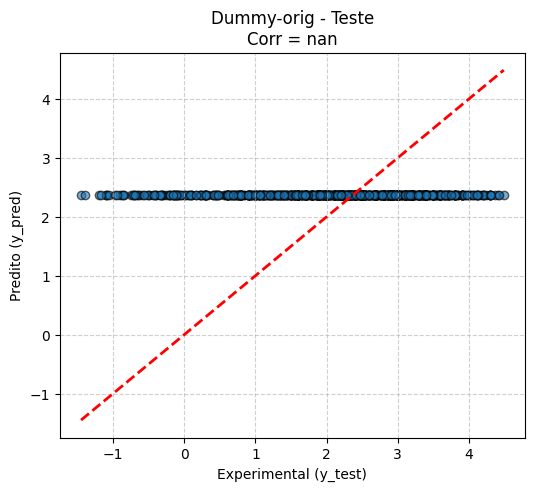


Treinando e avaliando: Dummy-std
Treino: MAE 0.964 | RMSE 1.212 | R2 -0.021 | Corr nan
Teste: MAE 0.971 | RMSE 1.236 | R2 -0.035 | Corr nan


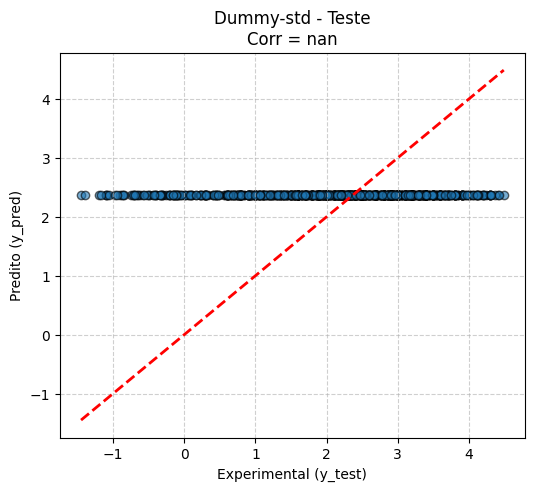


Treinando e avaliando: Dummy-norm
Treino: MAE 0.964 | RMSE 1.212 | R2 -0.021 | Corr nan
Teste: MAE 0.971 | RMSE 1.236 | R2 -0.035 | Corr nan


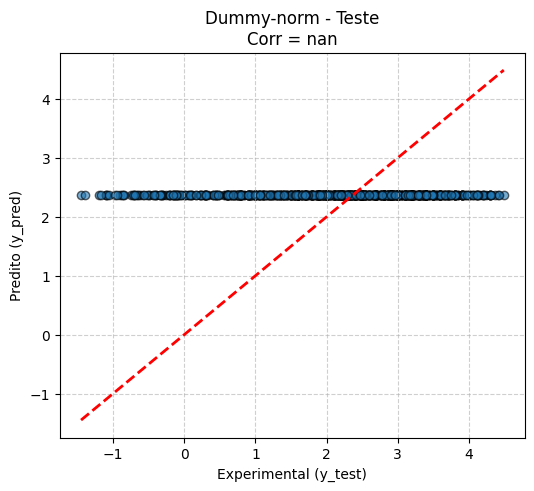


Treinando e avaliando: LR-orig
Treino: MAE 0.971 | RMSE 1.198 | R2 0.002 | Corr 0.045
Teste: MAE 0.975 | RMSE 1.217 | R2 -0.002 | Corr nan


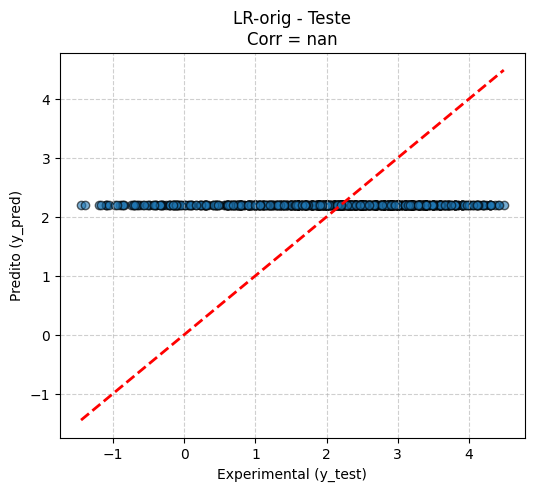


Treinando e avaliando: LR-std
Treino: MAE 0.565 | RMSE 0.721 | R2 0.639 | Corr 0.799
Teste: MAE 0.625 | RMSE 0.790 | R2 0.578 | Corr 0.761


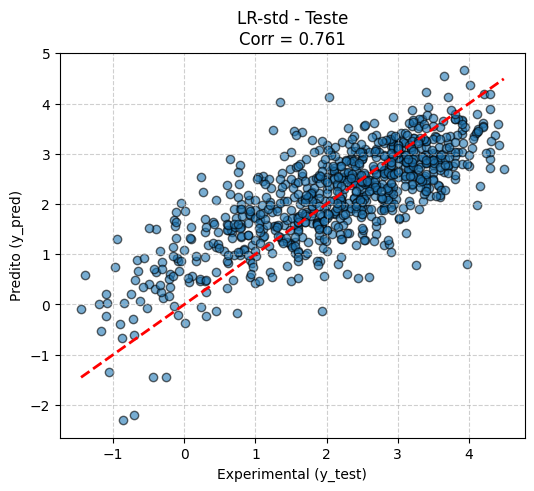


Treinando e avaliando: LR-norm
Treino: MAE 0.565 | RMSE 0.721 | R2 0.639 | Corr 0.799
Teste: MAE 0.625 | RMSE 0.790 | R2 0.578 | Corr 0.761


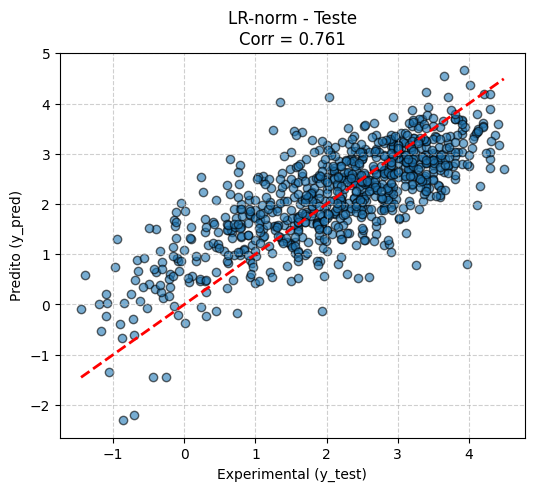


Treinando e avaliando: Ridge-orig
Treino: MAE 0.575 | RMSE 0.731 | R2 0.629 | Corr 0.793
Teste: MAE 0.622 | RMSE 0.788 | R2 0.580 | Corr 0.762


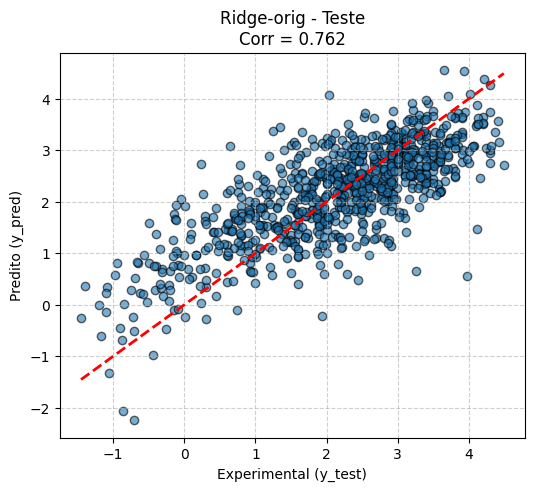


Treinando e avaliando: Ridge-std
Treino: MAE 0.577 | RMSE 0.735 | R2 0.625 | Corr 0.790
Teste: MAE 0.625 | RMSE 0.789 | R2 0.579 | Corr 0.761


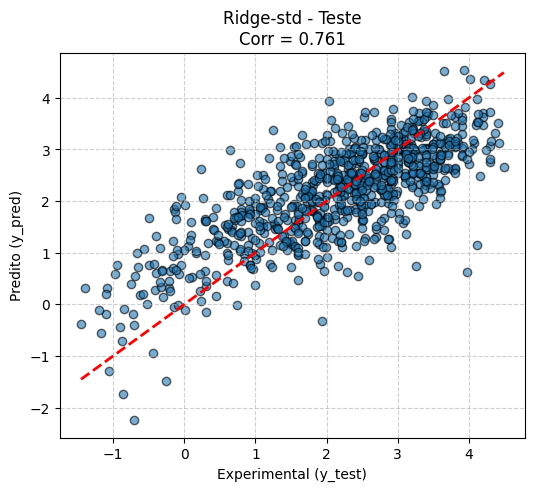


Treinando e avaliando: Ridge-norm
Treino: MAE 0.603 | RMSE 0.763 | R2 0.595 | Corr 0.772
Teste: MAE 0.642 | RMSE 0.810 | R2 0.556 | Corr 0.746


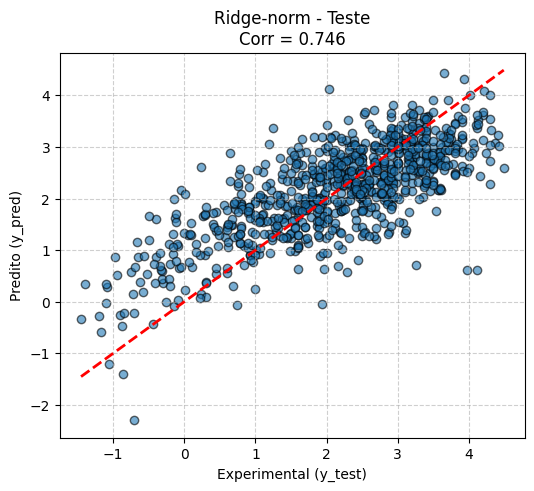


Treinando e avaliando: Lasso-orig
Treino: MAE 0.859 | RMSE 1.064 | R2 0.213 | Corr 0.468
Teste: MAE 0.868 | RMSE 1.088 | R2 0.199 | Corr 0.460


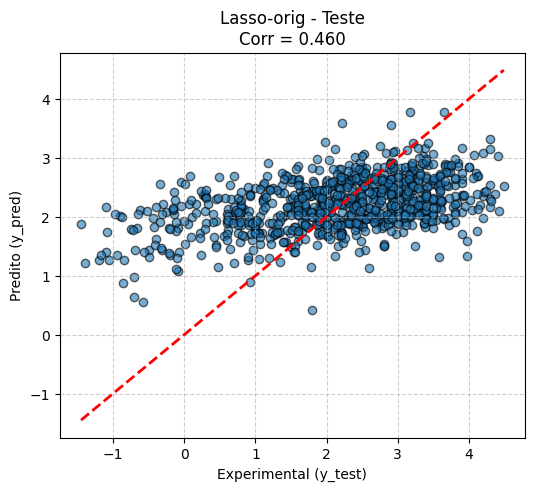


Treinando e avaliando: Lasso-std
Treino: MAE 0.972 | RMSE 1.199 | R2 0.000 | Corr nan
Teste: MAE 0.975 | RMSE 1.217 | R2 -0.002 | Corr nan


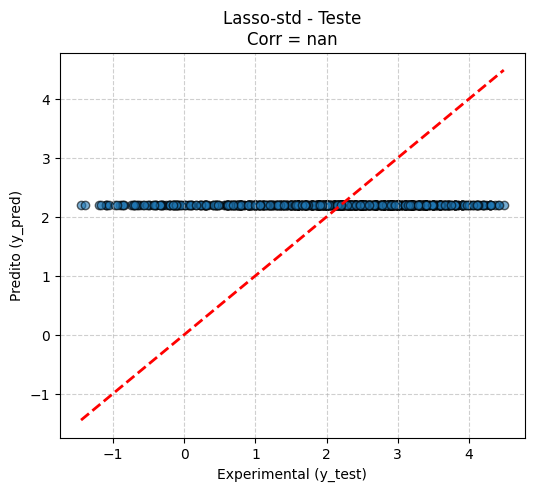


Treinando e avaliando: Lasso-norm
Treino: MAE 0.972 | RMSE 1.199 | R2 0.000 | Corr nan
Teste: MAE 0.975 | RMSE 1.217 | R2 -0.002 | Corr nan


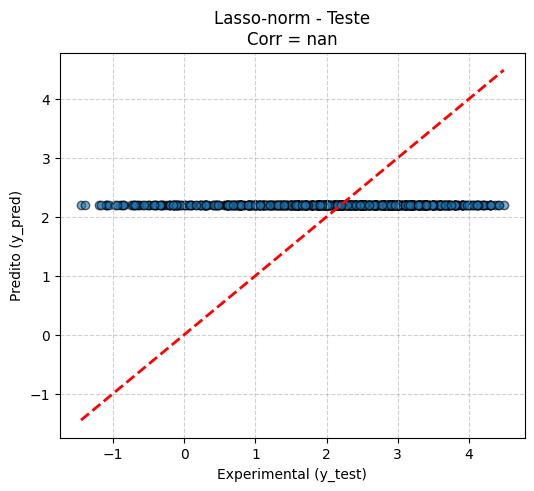


Treinando e avaliando: KNN-orig
Treino: MAE 0.772 | RMSE 0.978 | R2 0.335 | Corr 0.579
Teste: MAE 0.966 | RMSE 1.226 | R2 -0.018 | Corr 0.262


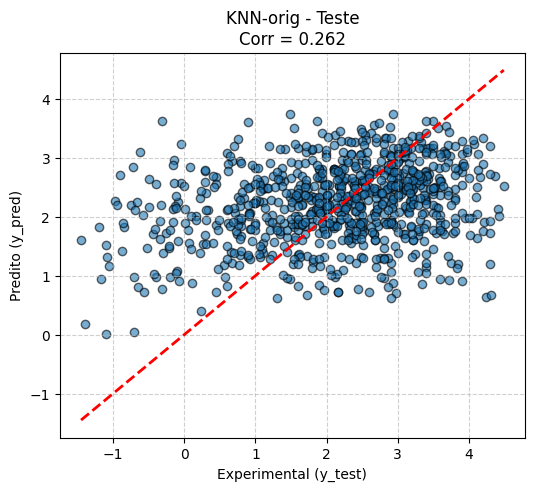


Treinando e avaliando: KNN-std
Treino: MAE 0.493 | RMSE 0.662 | R2 0.695 | Corr 0.836
Teste: MAE 0.631 | RMSE 0.859 | R2 0.501 | Corr 0.710


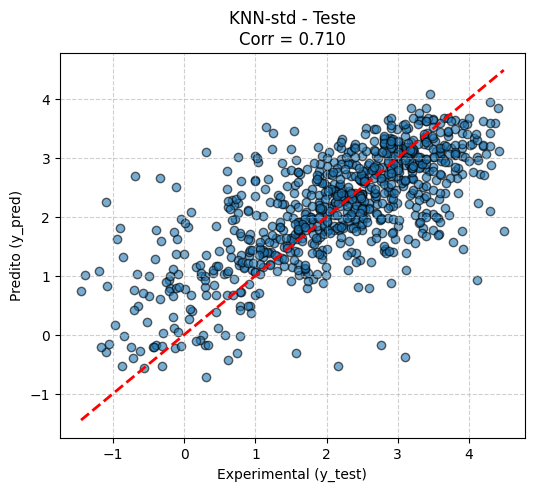


Treinando e avaliando: KNN-norm
Treino: MAE 0.507 | RMSE 0.677 | R2 0.681 | Corr 0.827
Teste: MAE 0.643 | RMSE 0.860 | R2 0.499 | Corr 0.708


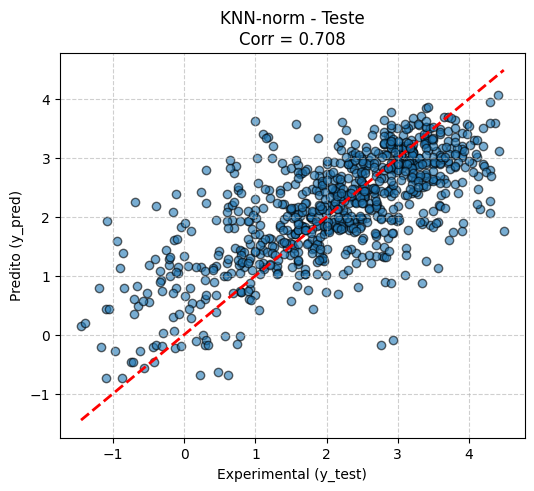


Treinando e avaliando: CART-orig
Treino: MAE 0.002 | RMSE 0.015 | R2 1.000 | Corr 1.000
Teste: MAE 0.712 | RMSE 0.970 | R2 0.363 | Corr 0.671


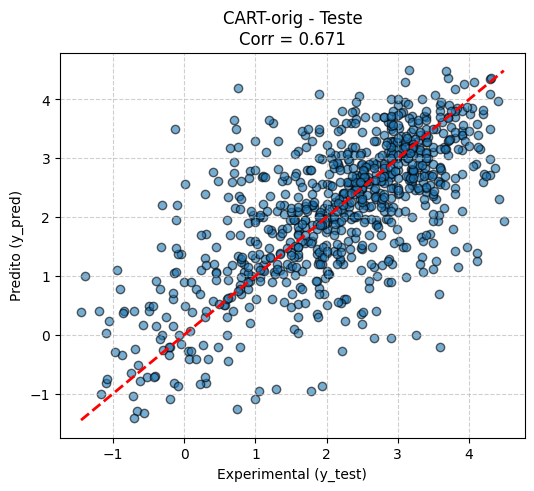


Treinando e avaliando: CART-std
Treino: MAE 0.002 | RMSE 0.015 | R2 1.000 | Corr 1.000
Teste: MAE 0.709 | RMSE 0.959 | R2 0.377 | Corr 0.677


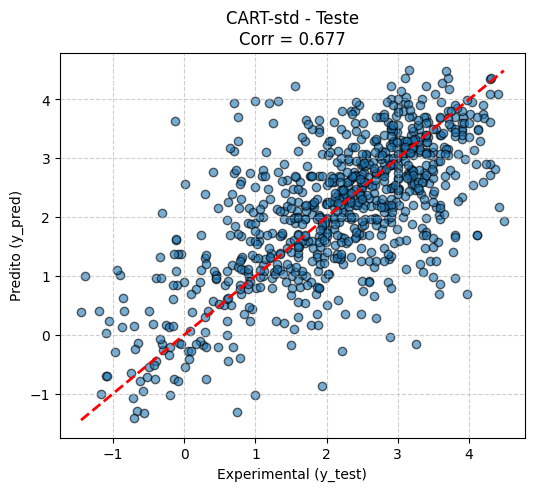


Treinando e avaliando: CART-norm
Treino: MAE 0.002 | RMSE 0.015 | R2 1.000 | Corr 1.000
Teste: MAE 0.707 | RMSE 0.964 | R2 0.372 | Corr 0.674


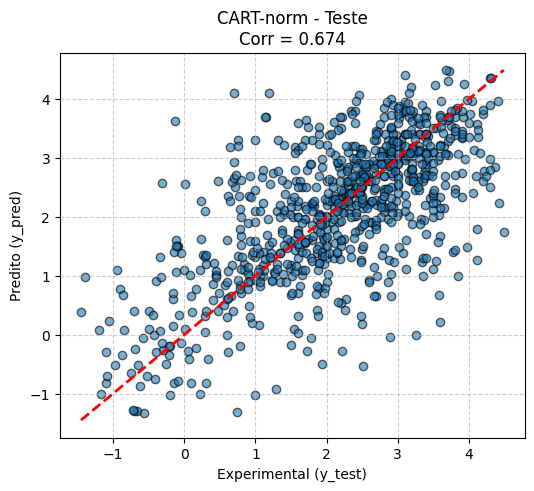


Treinando e avaliando: SVM-orig
Treino: MAE 0.963 | RMSE 1.209 | R2 -0.017 | Corr 0.045
Teste: MAE 0.971 | RMSE 1.235 | R2 -0.032 | Corr nan


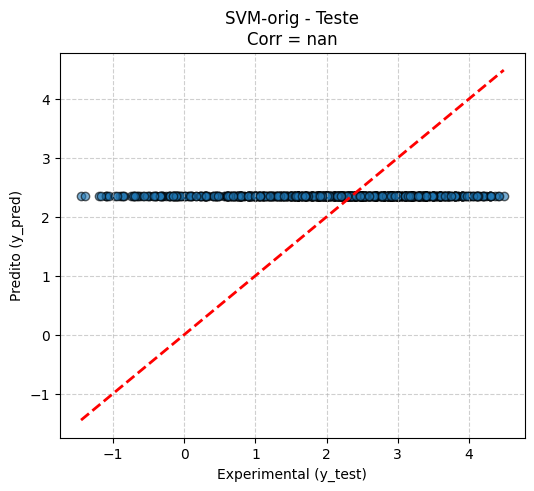


Treinando e avaliando: SVM-std
Treino: MAE 0.328 | RMSE 0.483 | R2 0.838 | Corr 0.921
Teste: MAE 0.494 | RMSE 0.680 | R2 0.687 | Corr 0.832


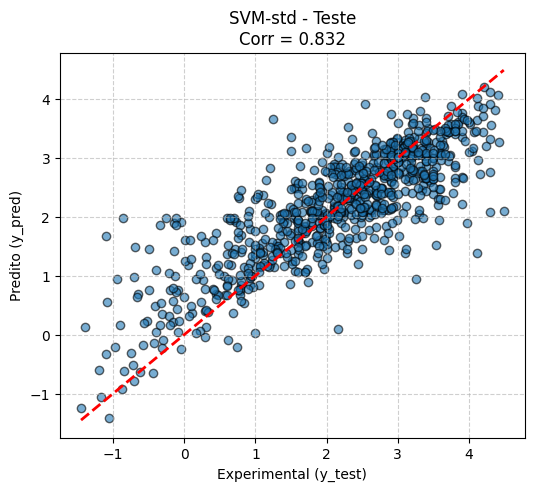


Treinando e avaliando: SVM-norm
Treino: MAE 0.496 | RMSE 0.665 | R2 0.693 | Corr 0.841
Teste: MAE 0.561 | RMSE 0.729 | R2 0.640 | Corr 0.808


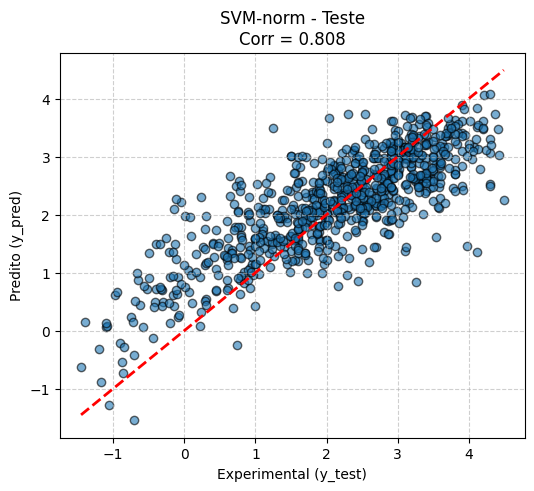


Treinando e avaliando: RF-orig
Treino: MAE 0.224 | RMSE 0.293 | R2 0.940 | Corr 0.985
Teste: MAE 0.610 | RMSE 0.806 | R2 0.561 | Corr 0.778


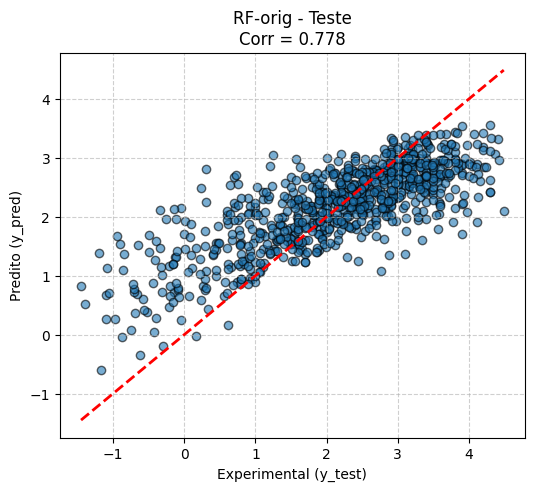


Treinando e avaliando: RF-std
Treino: MAE 0.226 | RMSE 0.296 | R2 0.939 | Corr 0.985
Teste: MAE 0.610 | RMSE 0.803 | R2 0.564 | Corr 0.780


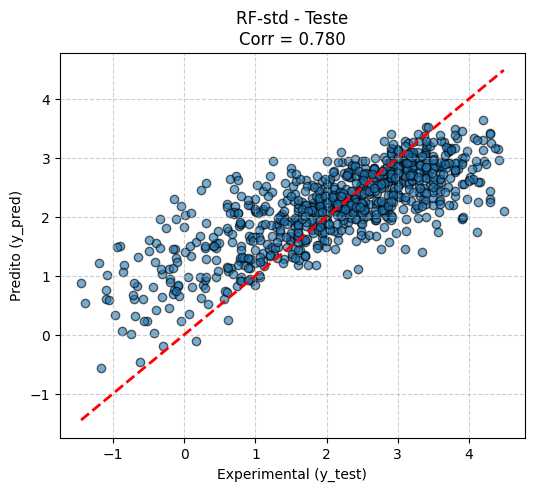


Treinando e avaliando: RF-norm
Treino: MAE 0.223 | RMSE 0.293 | R2 0.940 | Corr 0.985
Teste: MAE 0.611 | RMSE 0.808 | R2 0.559 | Corr 0.775


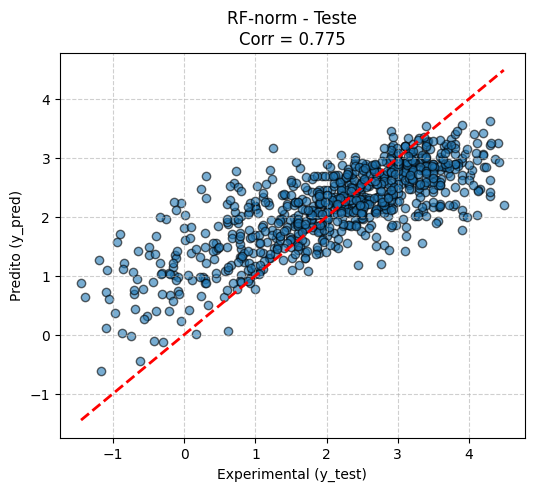


Treinando e avaliando: ExtraTrees-orig
Treino: MAE 0.002 | RMSE 0.015 | R2 1.000 | Corr 1.000
Teste: MAE 0.586 | RMSE 0.788 | R2 0.579 | Corr 0.779


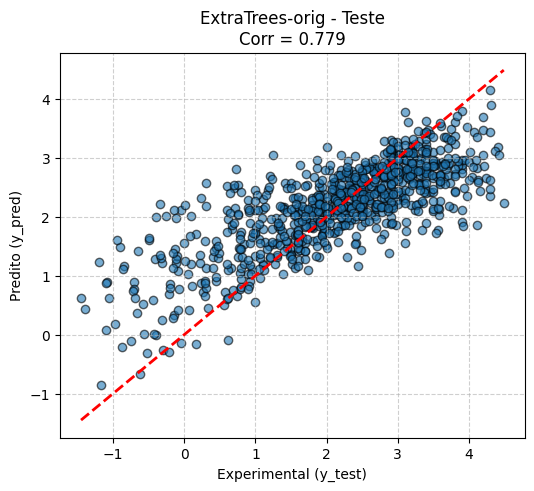


Treinando e avaliando: ExtraTrees-std
Treino: MAE 0.002 | RMSE 0.015 | R2 1.000 | Corr 1.000
Teste: MAE 0.588 | RMSE 0.787 | R2 0.581 | Corr 0.782


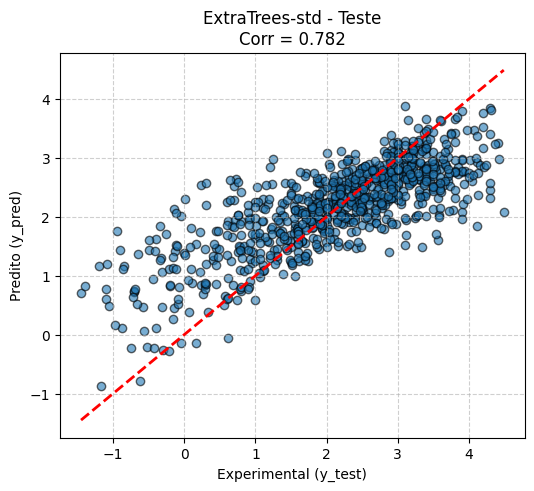


Treinando e avaliando: ExtraTrees-norm
Treino: MAE 0.002 | RMSE 0.015 | R2 1.000 | Corr 1.000
Teste: MAE 0.582 | RMSE 0.785 | R2 0.583 | Corr 0.783


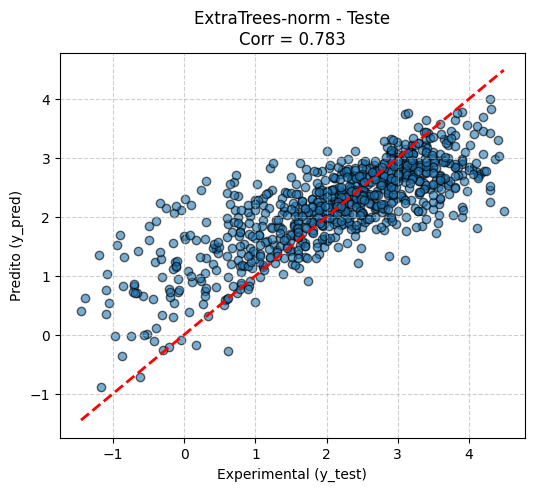


Treinando e avaliando: Bagging-orig
Treino: MAE 0.195 | RMSE 0.261 | R2 0.953 | Corr 0.982
Teste: MAE 0.536 | RMSE 0.712 | R2 0.657 | Corr 0.813


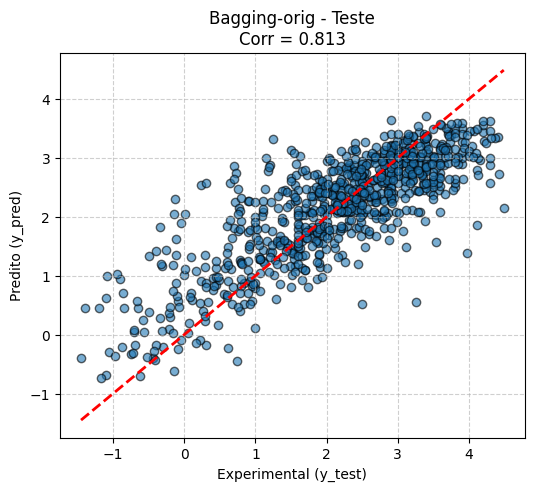


Treinando e avaliando: Bagging-std
Treino: MAE 0.196 | RMSE 0.263 | R2 0.952 | Corr 0.982
Teste: MAE 0.537 | RMSE 0.712 | R2 0.657 | Corr 0.813


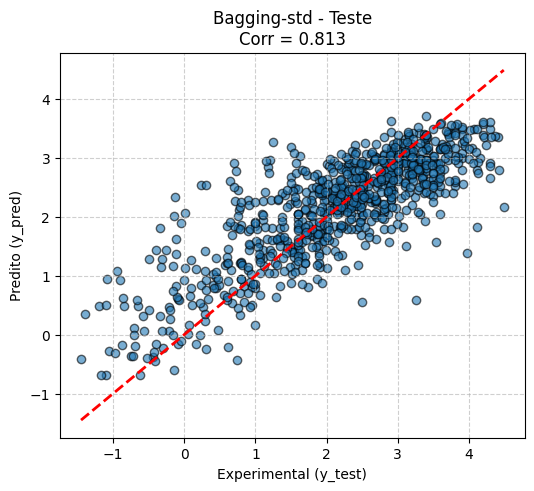


Treinando e avaliando: Bagging-norm
Treino: MAE 0.196 | RMSE 0.261 | R2 0.952 | Corr 0.982
Teste: MAE 0.534 | RMSE 0.711 | R2 0.658 | Corr 0.814


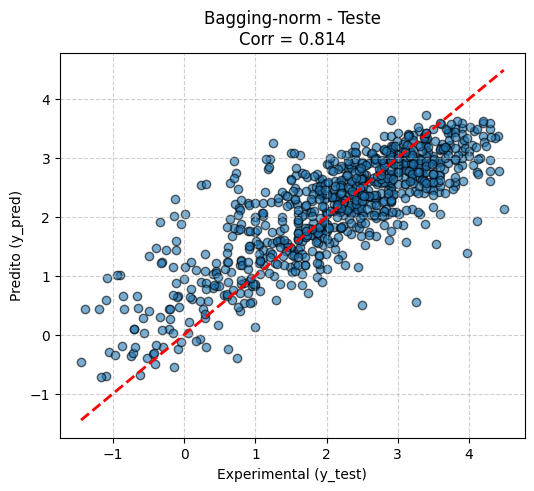


Treinando e avaliando: AdaBoost-orig
Treino: MAE 0.727 | RMSE 0.867 | R2 0.477 | Corr 0.725
Teste: MAE 0.751 | RMSE 0.907 | R2 0.443 | Corr 0.689


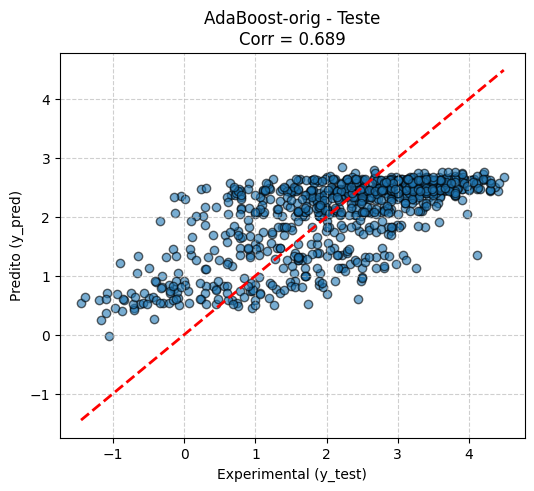


Treinando e avaliando: AdaBoost-std
Treino: MAE 0.728 | RMSE 0.869 | R2 0.476 | Corr 0.724
Teste: MAE 0.754 | RMSE 0.911 | R2 0.438 | Corr 0.684


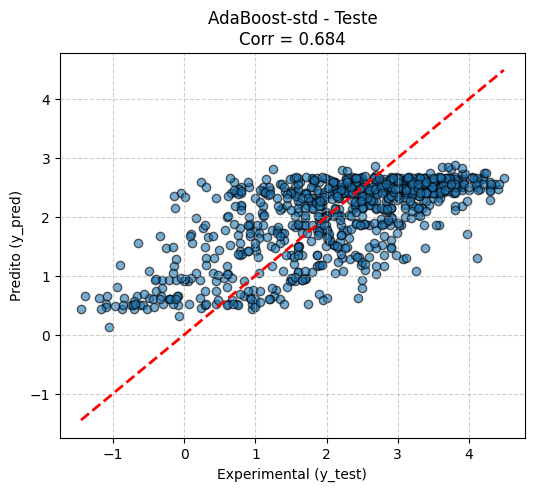


Treinando e avaliando: AdaBoost-norm
Treino: MAE 0.730 | RMSE 0.869 | R2 0.475 | Corr 0.726
Teste: MAE 0.749 | RMSE 0.907 | R2 0.443 | Corr 0.691


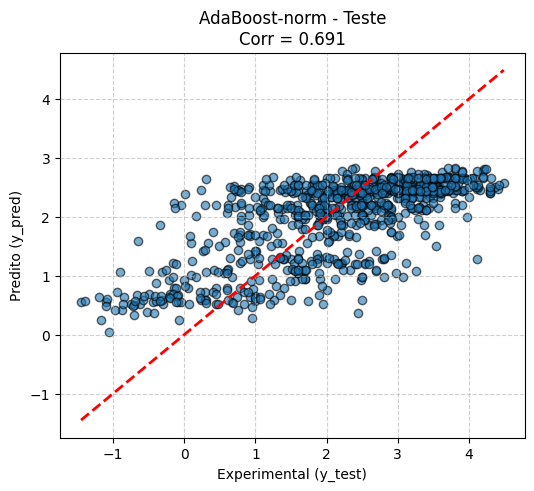


Treinando e avaliando: KNN-std_hiper
Treino: MAE 0.002 | RMSE 0.015 | R2 1.000 | Corr 1.000
Teste: MAE 0.575 | RMSE 0.789 | R2 0.579 | Corr 0.763


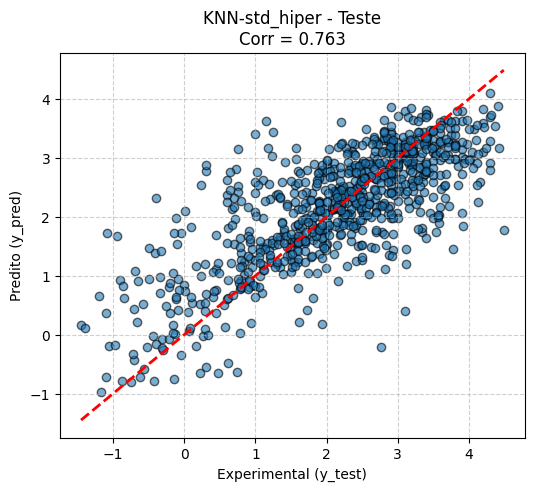


Treinando e avaliando: CART-std_hiper
Treino: MAE 0.656 | RMSE 0.832 | R2 0.518 | Corr 0.720
Teste: MAE 0.714 | RMSE 0.927 | R2 0.419 | Corr 0.653


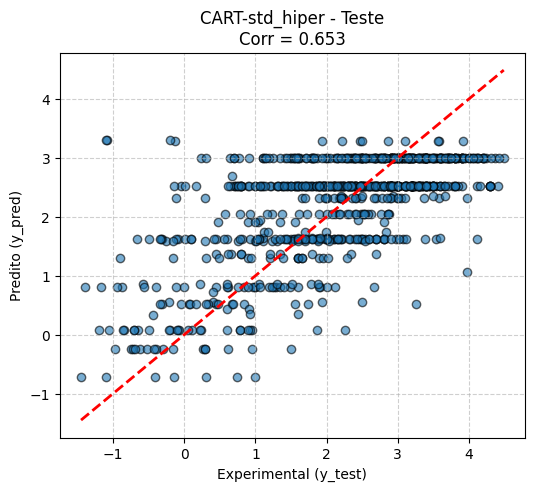


Treinando e avaliando: RF-std_hiper
Treino: MAE 0.217 | RMSE 0.284 | R2 0.944 | Corr 0.986
Teste: MAE 0.587 | RMSE 0.772 | R2 0.597 | Corr 0.799


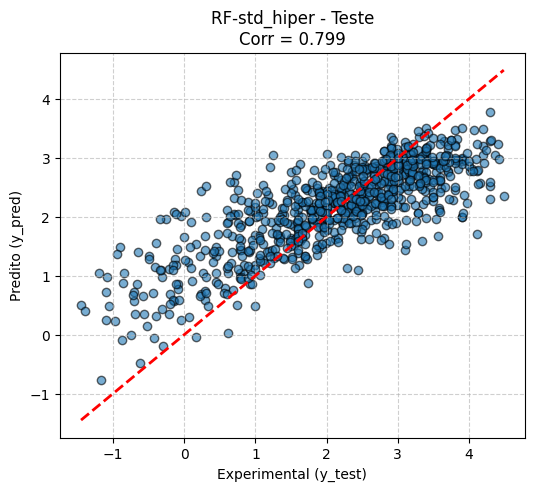


Treinando e avaliando: ExtraTrees-std_hiper
Treino: MAE 0.002 | RMSE 0.015 | R2 1.000 | Corr 1.000
Teste: MAE 0.570 | RMSE 0.763 | R2 0.606 | Corr 0.795


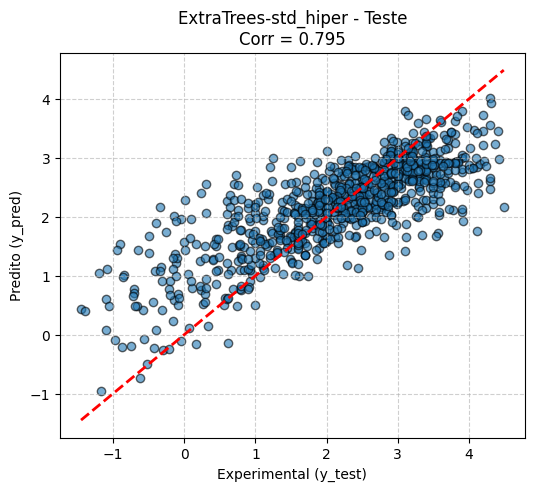


Treinando e avaliando: SVM-std_hiper
Treino: MAE 0.122 | RMSE 0.185 | R2 0.976 | Corr 0.988
Teste: MAE 0.454 | RMSE 0.645 | R2 0.718 | Corr 0.848


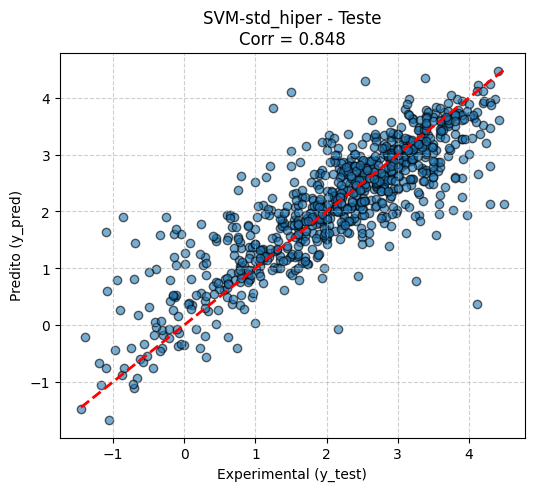

In [ ]:
# Adicionar sufixo _hiper aos modelos otimizados
best_models_hiper = {f"{name}_hiper": model for name, model in best_models.items()}

# Combinar todos os modelos: baselines e os hiperparametrizados
all_models = cleaned_models.copy()  # modelos baseline treinados anteriormente
all_models.update(best_models_hiper)      # adicionar modelos com hiperparametros otimizados

# Dicionário para guardar resultados finais
final_results = []

for name, model in all_models.items():
    print(f"\nTreinando e avaliando: {name}")

    # Treinar modelo com todo o conjunto de treino
    model.fit(x_train, y_train)

    # Previsões
    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)

    # Avaliar métricas
    train_metrics = evaluate_regression(y_train, y_train_pred)
    test_metrics = evaluate_regression(y_test, y_test_pred)

    # Correlação
    train_corr, _ = pearsonr(y_train, y_train_pred)
    test_corr, _ = pearsonr(y_test, y_test_pred)

    # Salvar resultados
    final_results.append({
        "Modelo": name,
        "Treino MAE": train_metrics["MAE"],
        "Treino RMSE": train_metrics["RMSE"],
        "Treino R2": train_metrics["R2"],
        "Treino Corr": train_corr,
        "Teste MAE": test_metrics["MAE"],
        "Teste RMSE": test_metrics["RMSE"],
        "Teste R2": test_metrics["R2"],
        "Teste Corr": test_corr
    })

    # Mostrar resultados
    print(f"Treino: MAE {train_metrics['MAE']:.3f} | RMSE {train_metrics['RMSE']:.3f} | "
          f"R2 {train_metrics['R2']:.3f} | Corr {train_corr:.3f}")
    print(f"Teste: MAE {test_metrics['MAE']:.3f} | RMSE {test_metrics['RMSE']:.3f} | "
          f"R2 {test_metrics['R2']:.3f} | Corr {test_corr:.3f}")

    # Gráfico: Previsão vs Real (Teste)
    plt.figure(figsize=(6, 5))
    plt.scatter(y_test, y_test_pred, alpha=0.6, edgecolor='k')
    plt.plot([y_test.min(), y_test.max()],
             [y_test.min(), y_test.max()], 'r--', lw=2)
    plt.xlabel('Experimental (y_test)')
    plt.ylabel('Predito (y_pred)')
    plt.title(f'{name} - Teste\nCorr = {test_corr:.3f}')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()


In [ ]:
final_results_df = pd.DataFrame(final_results)
final_results_df = final_results_df.sort_values(by="Teste RMSE").round(3)
final_results_df


,Modelo,Treino MAE,Treino RMSE,Treino R2,Treino Corr,Teste MAE,Teste RMSE,Teste R2,Teste Corr
37,SVM-std_hiper,0.122,0.185,0.976,0.988,0.454,0.645,0.718,0.848
19,SVM-std,0.328,0.483,0.838,0.921,0.494,0.680,0.687,0.832
29,Bagging-norm,0.196,0.261,0.952,0.982,0.534,0.711,0.658,0.814
28,Bagging-std,0.196,0.263,0.952,0.982,0.537,0.712,0.657,0.813
27,Bagging-orig,0.195,0.261,0.953,0.982,0.536,0.712,0.657,0.813
20,SVM-norm,0.496,0.665,0.693,0.841,0.561,0.729,0.640,0.808
36,ExtraTrees-std_hiper,0.002,0.015,1.000,1.000,0.570,0.763,0.606,0.795
35,RF-std_hiper,0.217,0.284,0.944,0.986,0.587,0.772,0.597,0.799
26,ExtraTrees-norm,0.002,0.015,1.000,1.000,0.582,0.785,0.583,0.783
25,ExtraTrees-std,0.002,0.015,1.000,1.000,0.588,0.787,0.581,0.782
